In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
# build resnet model
def resnet_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2)):
    filters1, filters2, filters3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    x = tf.keras.layers.Conv2D(filters1, (1, 1), strides=strides, name=conv_name_base + '2a')(input_tensor)
    x = tf.keras.layers.BatchNormalization(name=bn_name_base + '2a')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.Conv2D(filters2, kernel_size, padding='same', name=conv_name_base + '2b')(x)
    x = tf.keras.layers.BatchNormalization(name=bn_name_base + '2b')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.Conv2D(filters3, (1, 1), name=conv_name_base + '2c')(x)
    x = tf.keras.layers.BatchNormalization(name=bn_name_base + '2c')(x)
    shortcut = tf.keras.layers.Conv2D(filters3, (1, 1), strides=strides, name=conv_name_base + '1')(input_tensor)
    shortcut = tf.keras.layers.BatchNormalization(name=bn_name_base + '1')(shortcut)
    x = tf.keras.layers.add([x, shortcut])
    x = tf.keras.layers.Activation('relu')(x)
    return x

def resnet50(input_shape=(224, 224, 3), classes=1000):
    img_input = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.ZeroPadding2D((3, 3))(img_input)
    x = tf.keras.layers.Conv2D(64, (7, 7), strides=(2, 2), name='conv1')(x)
    x = tf.keras.layers.BatchNormalization(name='bn_conv1')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2))(x)
    x = resnet_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
    x = resnet_block(x, 3, [64, 64, 256], stage=2, block='b')
    x = resnet_block(x, 3, [64, 64, 256], stage=2, block='c')
    x = resnet_block(x, 3, [128, 128, 512], stage=3, block='a')
    x = resnet_block(x, 3, [128, 128, 512], stage=3, block='b')
    x = resnet_block(x, 3, [128, 128, 512], stage=3, block='c')
    x = resnet_block(x, 3, [128, 128, 512], stage=3, block='d')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='a')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='b')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='c')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='d')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='e')
    x = resnet_block(x, 3, [256, 256, 1024], stage=4, block='f')
    x = resnet_block(x, 3, [512, 512, 2048], stage=5, block='a')
    x = resnet_block(x, 3, [512, 512, 2048], stage=5, block='b')
    x = resnet_block(x, 3, [512, 512, 2048], stage=5, block='c')
    x = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(x)
    x = tf.keras.layers.Dense(classes, activation='softmax', name='fc' + str(classes))(x)

    model = tf.keras.models.Model(inputs=img_input, outputs=x, name='resnet50')
    return model


    



2025-03-08 03:50:03.697823: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741405803.868640    2297 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741405803.919358    2297 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-08 03:50:04.327921: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# build resnet model
resnet50 = resnet50()
resnet50.summary()

I0000 00:00:1741405921.184374    2297 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1767 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1 (Conv2D)      │ (None, 112, 112,  │      9,472 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_conv1            │ (None, 112, 112,  │        256 │ conv1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ bn_conv1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 55, 55,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_branch2a      │ (None, 55, 55,    │      4,160 │ max_pooling2d[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_branch2a       │ (None, 55, 55,    │        256 │ res2a_branch2a[0… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 55, 55,    │          0 │ bn2a_branch2a[0]… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_branch2b      │ (None, 55, 55,    │     36,928 │ activation_1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_branch2b       │ (None, 55, 55,    │        256 │ res2a_branch2b[0… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 55, 55,    │          0 │ bn2a_branch2b[0]… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_branch2c      │ (None, 55, 55,    │     16,640 │ activation_2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res2a_branch1       │ (None, 55, 55,    │     16,640 │ max_pooling2d[0]… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_branch2c       │ (None, 55, 55,    │      1,024 │ res2a_branch2c[0… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn2a_branch1        │ (None, 55, 55,    │      1,024 │ res2a_branch1[0]… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 55, 55,    │          0 │ bn2a_branch2c[0]

 Total params: 40,242,024 (153.51 MB)

 Trainable params: 40,166,376 (153.22 MB)

 Non-trainable params: 75,648 (295.50 KB)

In [3]:
tf.keras.utils.plot_model(resnet50, show_shapes=True)

In [4]:

# pre-trained ResNet on the Intel Image Classification dataset
resnet50_pretrained = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 371s 4us/step


In [5]:
tf.keras.utils.plot_model(resnet50_pretrained, show_shapes=True, show_layer_activations=True, show_trainable=True, to_file='resnet50_pretrained.png')

In [24]:
#  tune the resnet50 pretrained model for scene classification
# load the Scene Classification dataset
import os
file_path = "/mnt/c/Users/ASUS/Downloads/scene_detection/scene_detection"
train_dir = "/mnt/c/Users/ASUS/Downloads/scene_detection/scene_detection/seg_train/seg_train"
validation_dir = "/mnt/c/Users/ASUS/Downloads/scene_detection/scene_detection/seg_test/seg_test"

categories = ['buildings', 'forest', 'glacier', 'mountain', 'forest', 'buildings']
train_categories = os.listdir(train_dir)
validation_categories = os.listdir(validation_dir)

print(train_categories)
print(validation_categories)






['buildings', 'forest', 'glacier', 'mountain', 'sea']
['buildings', 'forest', 'glacier', 'mountain', 'sea']


In [26]:
# prepare data set to train the model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
validation_datagen = ImageDataGenerator(rescale=1./255)



In [27]:
train_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224), batch_size=32, class_mode='categorical')
validation_generator = validation_datagen.flow_from_directory(validation_dir, target_size=(224, 224), batch_size=32, class_mode='categorical')


Found 10644 images belonging to 5 classes.
Found 2499 images belonging to 5 classes.


In [28]:
train_generator.class_indices , validation_generator.class_indices

({'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4},
 {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4})

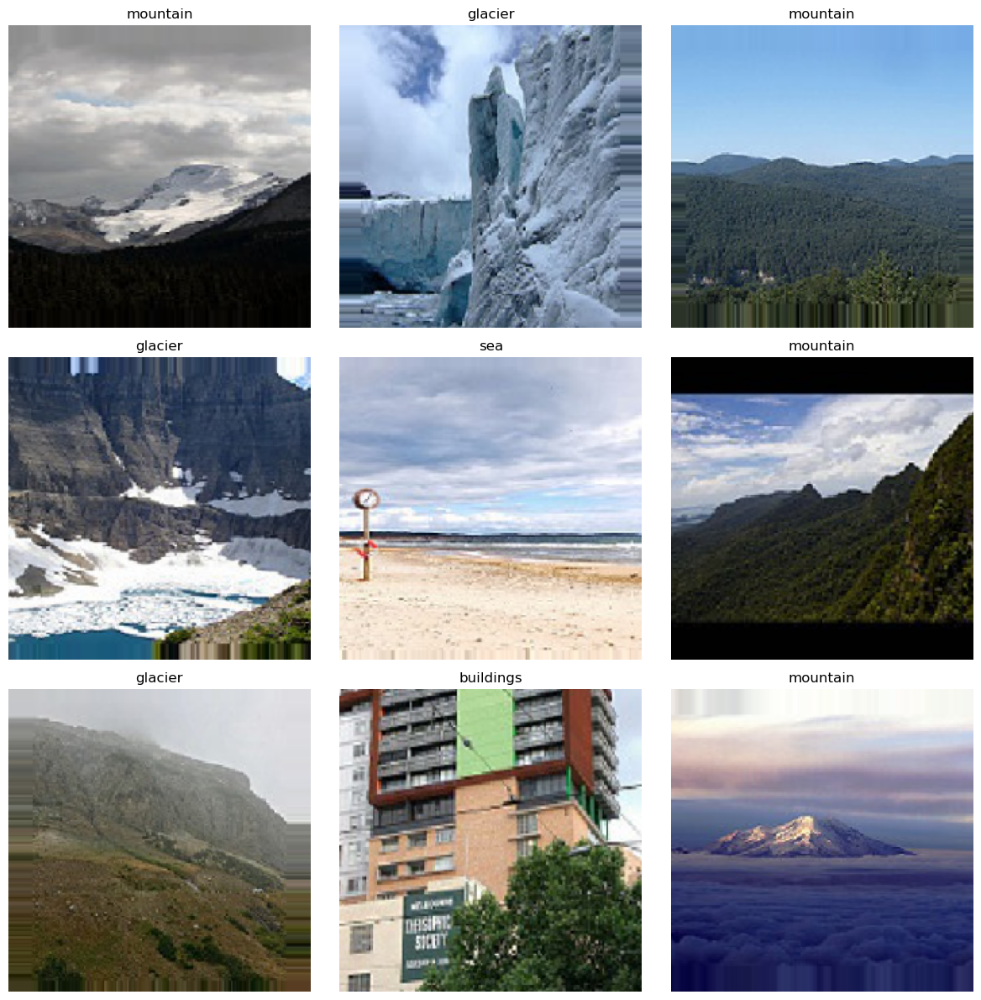

Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea']


In [ ]:
# Visualize classes and images
import matplotlib.pyplot as plt

# Get a batch of training data
x_batch, y_batch = next(train_generator)
class_names = list(train_generator.class_indices.keys())
# Plot the images in the batch, along with the corresponding labels
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for img, ax in zip(x_batch, axes):
    ax.imshow(img)
    ax.axis('off')
for i, ax in enumerate(axes):
    ax.set_title(class_names[np.argmax(y_batch[i])])
plt.tight_layout()
plt.show()
# Display class names
print("Class names:", class_names)

In [30]:
# Compile the model
resnet50_pretrained.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = resnet50_pretrained.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=10
)

Epoch 1/10


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None, 5), output.shape=(None, 7, 7, 2048)